In [50]:
import sys
import os
import torch
sys.path.append(os.path.abspath('')) # 절대 경로 설정

# Meshes 로드를 위한 유틸 함수
from pytorch3d.io import load_objs_as_meshes, load_obj
import matplotlib.pyplot as plt
from plot_image_grid import image_grid
# 렌더링을 위한 자료 구조 함수 리스트
## Meshes: 그물망
## structures: 다양한 수의 면과 꼭짓점을 가진 삼각측정 메쉬 배치로 작업하고 표현 간에 변환하는 함수를 제공
from pytorch3d.structures import Meshes

from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.vis.texture_vis import texturesuv_image_matplotlib

##|
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras,
    PointLights,
    Materials,
    RasterizationSettings,
    MeshRenderer,
    MeshRasterizer,
    SoftPhongShader,
    TexturesUV,
    TexturesVertex
)


In [16]:
!wget https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py

--2022-09-23 18:43:05--  https://raw.githubusercontent.com/facebookresearch/pytorch3d/main/docs/tutorials/utils/plot_image_grid.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1608 (1.6K) [text/plain]
Saving to: 'plot_image_grid.py.1'

plot_image_grid.py. 100%[===================>]   1.57K  --.-KB/s    in 0s      

2022-09-23 18:43:05 (27.9 MB/s) - 'plot_image_grid.py.1' saved [1608/1608]



In [13]:
!mkdir -p data/cow_mesh
!wget -P data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.obj
!wget -P data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.mtl
!wget -P data/cow_mesh https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow_texture.png

--2022-09-23 18:40:39--  https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.obj
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.75.142, 104.22.74.142, 172.67.9.4
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.75.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 330659 (323K) [text/plain]
Saving to: 'data/cow_mesh/cow.obj'

cow.obj             100%[===================>] 322.91K   615KB/s    in 0.5s    

2022-09-23 18:40:40 (615 KB/s) - 'data/cow_mesh/cow.obj' saved [330659/330659]

--2022-09-23 18:40:41--  https://dl.fbaipublicfiles.com/pytorch3d/data/cow_mesh/cow.mtl
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.74.142, 172.67.9.4, 104.22.75.142
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.74.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155 [text/plain]
Saving to: 'data/cow_mesh/cow.mtl'

cow.mtl             100%[==================

In [20]:
# Setup
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")

# Set paths
DATA_DIR = "./data"
obj_filename = os.path.join(DATA_DIR, "cow_mesh/cow.obj")

# Load obj file
mesh = load_objs_as_meshes([obj_filename], device=device)

(-0.5, 1023.5, 1023.5, -0.5)

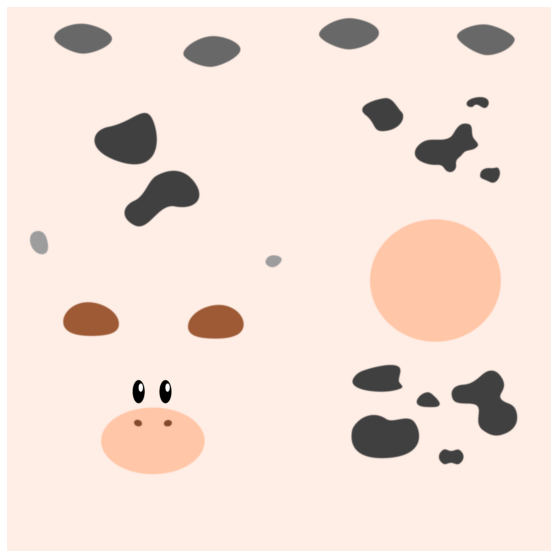

In [27]:
plt.figure(figsize=(10, 10))
texture_image = mesh.textures.maps_padded()
plt.imshow(texture_image.squeeze().cpu().numpy())
plt.axis("off")

(-0.5, 1023.5, 1023.5, -0.5)

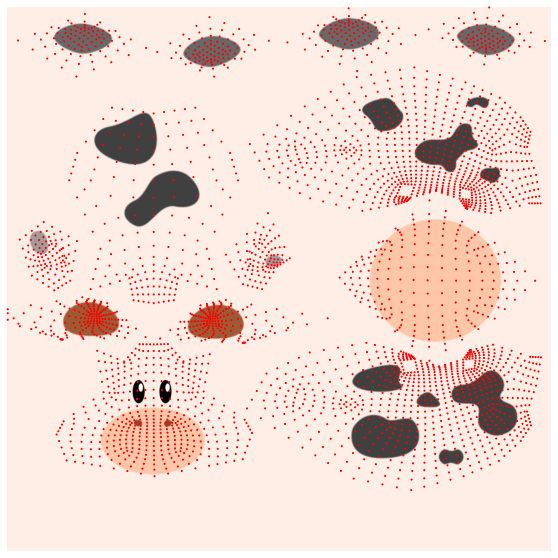

In [30]:
plt.figure(figsize=(10, 10))
texturesuv_image_matplotlib(mesh.textures, subsample=None)
plt.axis("off")

In [37]:
R, T = look_at_view_transform(2.7, 0, 180)

cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

raster_settings = RasterizationSettings(
    image_size=512,
    blur_radius=0.0,
    faces_per_pixel=1,
)

lights = PointLights(device=device, location=[[0.0, 0.0, -3.0]])

renderer = MeshRenderer(

    rasterizer=MeshRasterizer(
        cameras=cameras,
        raster_settings=raster_settings
    ),

    shader=SoftPhongShader(
        device=device,
        cameras=cameras,
        lights=lights
    )
)

(-0.5, 511.5, 511.5, -0.5)

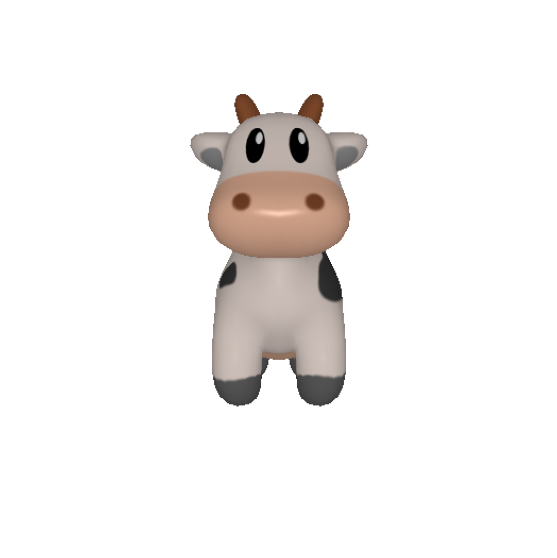

In [38]:
images = renderer(mesh)
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())
plt.axis("off")

In [39]:
lights.location = torch.tensor([0.0, 0.0, +1.0], device=device)[None]
images = renderer(mesh, lights=lights)

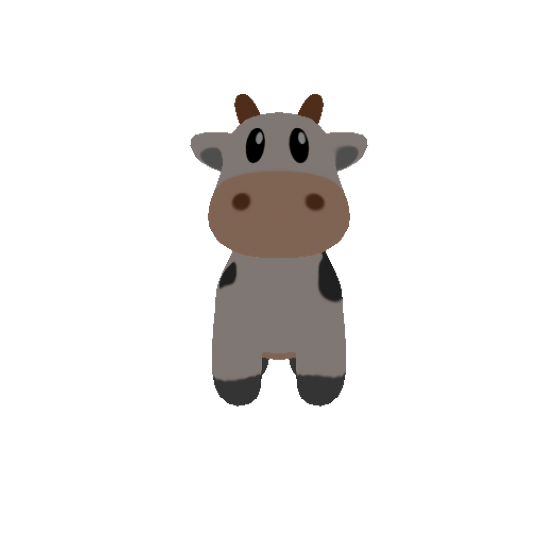

In [41]:
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())
plt.axis("off");

In [44]:
R, T = look_at_view_transform(dist=2.7, elev=10, azim=-150)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

lights.location = torch.tensor([[2.0, 2.0, -2.0]], device=device)

materials = Materials(
    device=device,
    specular_color=[[0.0, 1.0, 0.0]],
    shininess=10.0
)

images = renderer(mesh, lights=lights, materials=materials, cameras=cameras)

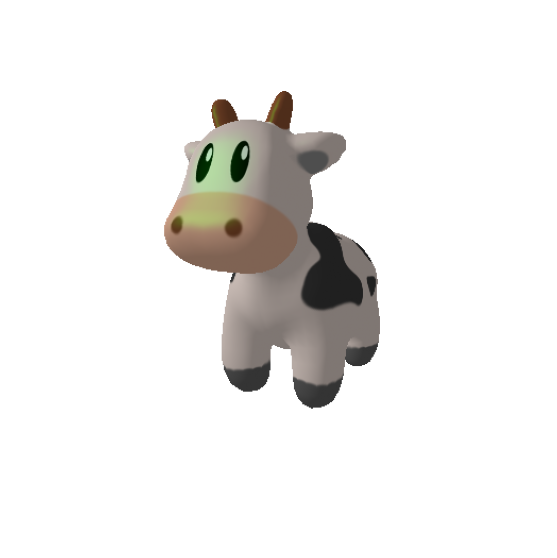

In [45]:
plt.figure(figsize=(10, 10))
plt.imshow(images[0, ..., :3].cpu().numpy())
plt.axis("off");

In [46]:
# Set batch size - this is the number of different viewpoints from which we want to render the mesh.
batch_size = 20

# Create a batch of meshes by repeating the cow mesh and associated textures.
# Meshes has a useful `extend` method which allows us do this very easily.
# This also extends the textures.
meshes = mesh.extend(batch_size)

# Get a batch of viewing angles.
elev = torch.linspace(0, 180, batch_size)
azim = torch.linspace(-180, 180, batch_size)

# All the cameras helper methods support mixed type inputs and broadcasting. So we can
# view the camera from the same distance and specify dist=2.7 as a float,
# and then specify elevation and azimuth angles for each viewpoint as tensors.
R, T = look_at_view_transform(dist=2.7, elev=elev, azim=azim)
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

# Move the light back in front of the cow which is facing the -z direction.
lights.location = torch.tensor([[0.0, 0.0, -3.0]], device=device)

In [47]:
# We can pass arbitrary keyword arguments to the rasterizer/shader via the renderer
# so the renderer does not need to be reinitialized if any of the settings change.
images = renderer(meshes, cameras=cameras, lights=lights)

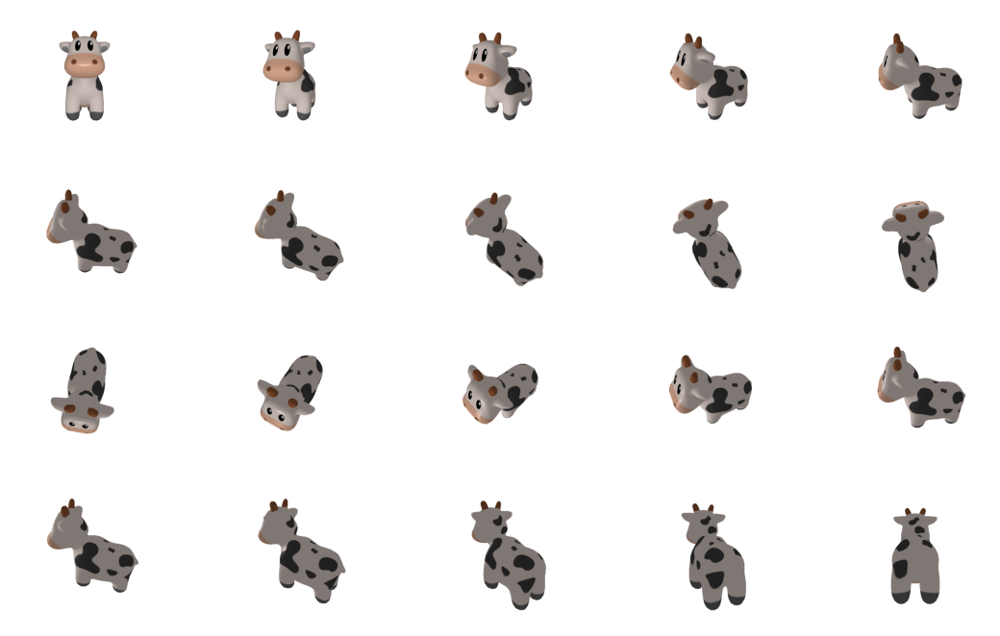

In [48]:
image_grid(images.cpu().numpy(), rows=4, cols=5, rgb=True)

In [77]:
verts, faces_idx, _ = load_obj(obj_filename)
faces = faces_idx.verts_idx

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)
textures = TexturesVertex(verts_features=verts_rgb.to(device))

# Create a Meshes object
mesh = Meshes(
    verts=[verts.to(device), (verts + 2).to(device)],
    faces=[faces.to(device), faces.to(device)],
    # textures=textures #
)

# Render the plotly figure
fig = plot_scene({
    "등심": {
        "cow1": mesh[0],
    },
    "부채살": {
        "cow3": mesh[1]
    }
})
fig.show()

In [81]:
mesh_4 = mesh.extend(2)

fig = plot_batch_individually(mesh_4)

fig.update_layout(height=1000, width=500)
fig.show()

In [82]:
fig2 = plot_scene({
    "cow_plot1": {
        "cows": mesh
    }
},
    xaxis={"backgroundcolor":"rgb(100, 200, 230)"},
    yaxis={"backgroundcolor":"rgb(130, 200, 200)"},
    zaxis={"backgroundcolor":"rgb(100, 230, 200)"},
    axis_args=AxisArgs(showgrid=True))
fig2.show()

In [83]:
fig3 = plot_batch_individually(
    mesh_4,
    ncols=2,
    subplot_titles = ["cow1", "cow2", "cow3", "cow4"], # customize subplot titles
    xaxis={"backgroundcolor":"rgb(200, 200, 230)"},
    yaxis={"backgroundcolor":"rgb(230, 200, 200)"},
    zaxis={"backgroundcolor":"rgb(200, 230, 200)"},
    axis_args=AxisArgs(showgrid=True))
fig3.show()